# Multi-Class Image Classification for Robust Outdoor Weather Recognition


**Authors**: [Dominic Muli](mailto:dominic.muli@student.moringaschool.com), [Evangeline Ngunjiri](mailto:evangeline.ngunjiri@student.moringaschool.com), and [Ivy Ndunge](mailto:ivy.ndunge@student.moringaschool.com)

## 1.0) Project Overview

In the "Visual Weather Recognition with Deep Learning" project, the objective is to create a sophisticated Convolutional Neural Network (CNN) model capable of accurately classifying diverse weather conditions based on visual cues in images. By leveraging deep learning techniques, the project aims to develop a robust system that can distinguish between various weather phenomena, including sunny, rainy, cloudy, and sunrise scenes. The key components include the collection and exploration of a comprehensive dataset, data preprocessing with augmentation to enhance model generalization, and the design of a specialized CNN architecture. The model will be trained and evaluated, with a focus on metrics such as accuracy, precision, and recall. Visualization techniques will be employed to gain insights into the CNN's interpretation of different weather patterns, and considerations for potential deployment scenarios will be explored.

Technologies utilized in this project include Python as the primary programming language, TensorFlow for building and training the CNN and Matplotlib and Seaborn for visualization.

## 1.1) Business Problem


The business objective is to leverage the multiclass weather dataset to advance the development of image classification models capable of accurately recognizing and categorizing different weather conditions. By doing so, this project aims to enhance the capabilities of outdoor weather analysis, offering valuable insights for sectors ranging from transportation and agriculture to urban planning and disaster preparedness.

## 1.2) Objectives

The primary aim of this project is to develop an advanced Convolutional Neural Network (CNN) model for accurate and robust weather classification based on visual cues in images. The objective extends beyond mere image recognition to the creation of a model that exhibits high-level understanding of complex visual patterns associated with different weather phenomena.

* Achieve an accuracy of at least 90% in classifying outdoor weather images across various conditions.
* Develop a model that is robust to variations in lighting, camera angles, and weather intensity.
* Minimize computational resources required for model training and inference.

## 1.3) Metric of Success

* Accuracy: Percentage of correctly classified weather images.
* Precision and Recall: Measures of how well the model identifies specific weather classes.
* F1-Score: Harmonic mean of precision and recall, providing a balanced measure of model performance.
* Inference Speed: Time taken to classify a single image.
* Computational Cost: Resources required to train and run the model.
* A robust and accurate multi-class image classification model for outdoor weather recognition.
* Potential applications in various sectors such as agriculture, aviation, and disaster management.

## 1.4) Data Relevance and Validation

The data available is relevant for the intended analysis and predictions

## 2.0) Understanding the Data

Multi-Class Image Classification of Outdoor Weather Dataset Description:

Name: Multi-class Weather Dataset for Image Classification

Size: 91.2MB

Format: Images with corresponding class labels (rain, cloudy, sunrise, shine)

Classes: 4
* Rain
* Cloudy
* Sunrise
* Shine

The data for this project is obtained from the [Mendeley Data website](https://data.mendeley.com/datasets/4drtyfjtfy/1?ref=hackernoon.com).

## 2.1) Reading the Data

### 2.1.1) Installations

In [60]:
# installations
# %pip install opencv-python
# %pip install tensorflow
# %pip install q keras==2.3.1
# %pip install numpy==1.23.5
# %pip install git+https://github.com/qubvel/segmentation_models
# %pip install pillow
# %pip install tqdm
# %pip install --upgrade numpy
# %pip install --upgrade seaborn
# %pip install --upgrade scipy
# %pip install Flask

### 2.1.2) Importing Relevant Libraries

In [2]:
# importing necessary libraries
import os, shutil
import inspect
import itertools
import time
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib 
from matplotlib import pyplot as plt
import random
from collections import Counter
from tqdm import tqdm
from PIL import Image
from scipy import ndimage
from shutil import copyfile
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.class_weight import compute_class_weight
from sklearn.utils.multiclass import unique_labels
from flask import Flask, request, jsonify
from tensorflow.keras.models import load_model
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import L2, L1, L1L2
from efficientnet.tfkeras import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
np.random.seed(123)

%matplotlib inline

### 2.1.3) Reading the Data

In [4]:
# reading the data

# path to the dataset
dataset_path = './data/dataset2/'

# List of supported weather classes based on file names
weather_classes = ['cloudy', 'rain', 'shine', 'sunrise']

# Dictionary to map weather class names to numerical labels
label_map = {weather_class: idx for idx, weather_class in enumerate(weather_classes)}

images_list = []
labels_list = []

filepaths = []
word_labels = []

# Function to extract class label from filename
def extract_label(filename):
    for weather_class in weather_classes:
        if weather_class in filename:
            return label_map[weather_class]
    return None

# Loop through each image file in the dataset directory
for img_file in tqdm(os.listdir(dataset_path), desc='Processing images'):
    img_path = os.path.join(dataset_path, img_file)
    
    try:
        # Open image using PIL
        img = Image.open(img_path)
        
        # Convert image to numpy array
        img = np.array(img)
        
        # Extract class label from the filename
        label = extract_label(img_file)
        word_label = [key for key, value in label_map.items() if value == label][0]
        if label is not None:
            # Append the image and its label to the lists
            images_list.append(img)
            labels_list.append(label)
            filepaths.append(img_path)
            word_labels.append(word_label)

    except Exception as e:
        print(f"Error processing image '{img_file}': {e}")

# Convert lists to numpy arrays
images = np.array(images_list)
labels = np.array(labels_list)
data = {'filepaths': filepaths, 'word_labels': word_labels}
df = pd.DataFrame(data)

print(f"Total images: {len(images)}")
print(f"Total labels: {len(labels)}")
df

Processing images: 100%|██████████| 1125/1125 [00:10<00:00, 103.97it/s]
<ipython-input-4-2d7436cff74c>:50: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  images = np.array(images_list)


Total images: 1125
Total labels: 1125


,filepaths,word_labels
0,./data/dataset2/cloudy1.jpg,cloudy
1,./data/dataset2/cloudy10.jpg,cloudy
2,./data/dataset2/cloudy100.jpg,cloudy
3,./data/dataset2/cloudy101.jpg,cloudy
4,./data/dataset2/cloudy102.jpg,cloudy
...,...,...
1120,./data/dataset2/sunrise95.jpg,sunrise
1121,./data/dataset2/sunrise96.jpg,sunrise
1122,./data/dataset2/sunrise97.jpg,sunrise
1123,./data/dataset2/sunrise98.jpg,sunrise


## 2.2) EDA before Preprocessing

### 2.2.1) Image preview

We will inspect 20 random images from the dataset

<ipython-input-4-e735c06e442a>:12: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(5, num_samples/5, i + 1)


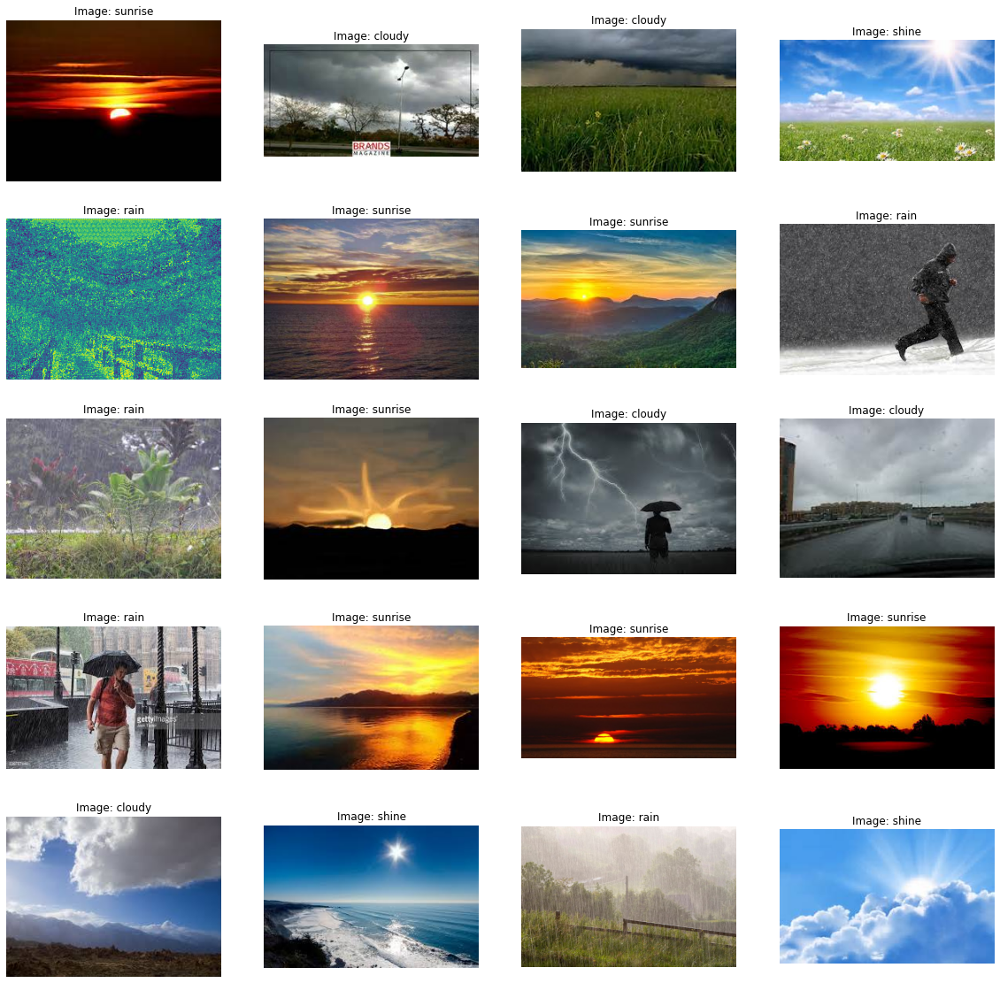

In [4]:
# previewing random images

def visualize_random_images(num_samples=20):
    plt.figure(figsize=(20, 20))
    for i in range(num_samples):
        random_idx = random.randint(0, len(images) - 1) 
        random_image = images[random_idx]
        
        filename = [key for key, value in label_map.items() if value == labels[random_idx]][0]
        
        # Displaying the image
        plt.subplot(5, num_samples/5, i + 1)
        plt.imshow(random_image)
        plt.title(f"Image: {filename}")
        plt.axis("off")
    plt.savefig('./images/images_preview.svg', format='svg', transparent=True)
    plt.show()

visualize_random_images()


### 2.2.2) Weather Class Distribution

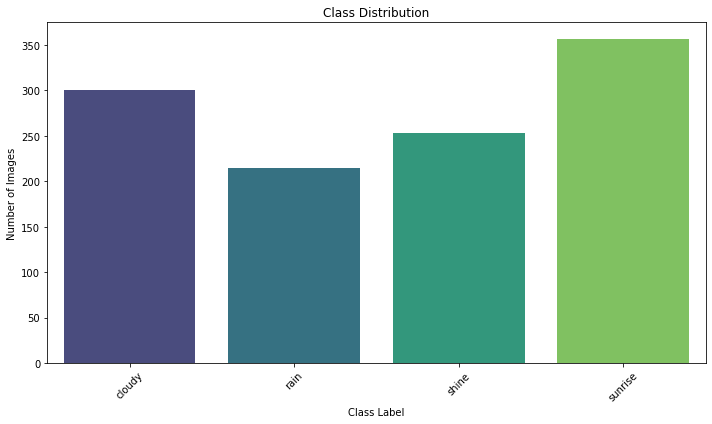

Counter({0: 300, 1: 215, 2: 253, 3: 357})

In [5]:
# class Distribution Visualization

# Get class titles from the label_map
class_titles = [key for key in label_map.keys()]

# Calculate class distribution using Counter
class_distribution = Counter(labels)

plt.figure(figsize=(10, 6))
sns.barplot(x=class_titles, y=list(class_distribution.values()), palette='viridis')
plt.xlabel("Class Label")
plt.ylabel("Number of Images")
plt.title("Class Distribution")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('./images/weather_class_distribution.svg', format='svg', transparent=True)
plt.show()
class_distribution

Observation: The weather classes are relatively evenly distributed. There are 300 images showing cloudy weather, 215 images showing rainy weather, 253 images showing shinny weather, and 357 images showing sunrise. This shows class imbalance.

### 2.2.3) Image Size Distribution

Processing images: 100%|██████████| 1125/1125 [00:00<00:00, 2570.90it/s]


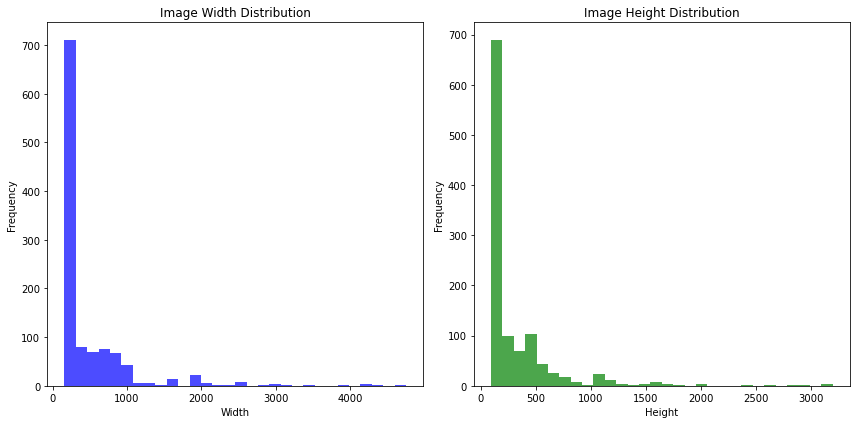

In [6]:
# image size distribution
image_sizes = []
for img_file in tqdm(os.listdir(dataset_path), desc='Processing images'):
    img_path = os.path.join(dataset_path, img_file)
    img = Image.open(img_path)
    width, height = img.size
    image_sizes.append((width, height))

widths, heights = zip(*image_sizes)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(widths, bins=30, color='blue', alpha=0.7)
plt.title('Image Width Distribution')
plt.xlabel('Width')
plt.ylabel('Frequency')
plt.subplot(1, 2, 2)
plt.hist(heights, bins=30, color='green', alpha=0.7)
plt.title('Image Height Distribution')
plt.xlabel('Height')
plt.ylabel('Frequency')

plt.tight_layout()
plt.savefig('./images/image_size_distribution.svg', format='svg', transparent=True)
plt.show()

Observation: The images have varying sizes (height and width).

### 2.2.4) Image Pixel Distribution

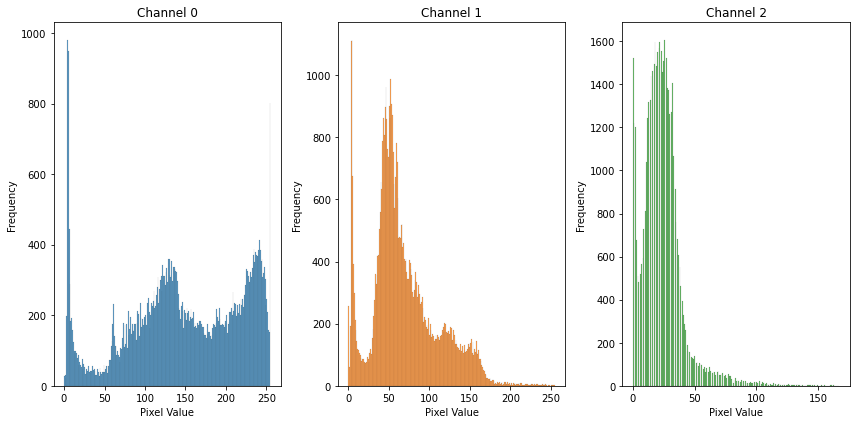

In [7]:
# Convert image to a NumPy array
img_array = np.array(img)

# Display pixel value distributions
plt.figure(figsize=(12, 6))

# Plot histograms for each color channel
for i in range(img_array.shape[2]):
    plt.subplot(1, 3, i + 1)
    sns.histplot(img_array[:, :, i].ravel(), bins=256, color=f'C{i}', alpha=0.7)
    plt.title(f'Channel {i}')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.savefig('./images/image_pixel_distribution.svg', format='svg', transparent=True)
plt.show()

Observation: the RGB color distribution 

### 2.2.5) Label Mappings

In [8]:
# viewing label mappings
for key, value in label_map.items():
    print(f"{key} : {value}")

cloudy : 0
rain : 1
shine : 2
sunrise : 3


## 2.3) Data Preprocessing

### 2.3.1) Splitting the Data

In [9]:
# Setting the paths for the train, test, and validation directories
train_imgs = "./data/traindataset/"
test_imgs = "./data/testdataset/"
val_imgs = "./data/valdataset/"

# Defining split ratios
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1


# Creating directories
os.makedirs(train_imgs, exist_ok=True)
os.makedirs(test_imgs, exist_ok=True)
os.makedirs(val_imgs, exist_ok=True)

# Splitting the DataFrame into train, validation, and test sets
train_df, df_2 = train_test_split(df, train_size=train_ratio, random_state=123, shuffle=True)
val_df, test_df = train_test_split(df_2, test_size=val_ratio/(test_ratio+val_ratio), random_state=123, shuffle=True)

# Function to copy/move files to subdirectories based on weather classes
def organize_images_by_weather_classes(file_list, source_dir, destination_dir, classes):
    for weather_class in classes:
        os.makedirs(os.path.join(destination_dir, weather_class), exist_ok=True)

    for filepath, label in zip(file_list['filepaths'], file_list['word_labels']):
        filename = os.path.basename(filepath)
        weather_class = label.lower()
        if weather_class in classes:
            destination_path = os.path.join(destination_dir, weather_class, filename)
            shutil.copy(filepath, destination_path)

# Copying and organizing images to train directory by weather classes
organize_images_by_weather_classes(train_df, dataset_path, train_imgs, weather_classes)

# Copying and organizing images to validation directory by weather classes
organize_images_by_weather_classes(val_df, dataset_path, val_imgs, weather_classes)

# Copying and organizing images to test directory by weather classes
organize_images_by_weather_classes(test_df, dataset_path, test_imgs, weather_classes)

# Function to count number of images in each subdirectory
def count_images_in_subdirectories(parent_directory, classes):
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']

    # Dictionary to store image counts for each class
    image_counts = {cls: 0 for cls in classes}

    # Iterating through each class directory and counting images
    for cls in classes:
        directory_path = os.path.join(parent_directory, cls)
        if os.path.exists(directory_path):
            for filename in os.listdir(directory_path):
                if any(filename.lower().endswith(ext) for ext in image_extensions):
                    image_counts[cls] += 1

    return image_counts

# Getting the count of images in each subdirectory
num_train_images = count_images_in_subdirectories(train_imgs, weather_classes)
num_val_images = count_images_in_subdirectories(val_imgs, weather_classes)
num_test_images = count_images_in_subdirectories(test_imgs, weather_classes)

# Displaying number of images in each class within directories
for cls in weather_classes:
    print(f"There are {num_train_images[cls]} {cls} images in the training set")
    print(f"There are {num_val_images[cls]} {cls} images in the validation set")
    print(f"There are {num_test_images[cls]} {cls} images in the test set")

There are 232 cloudy images in the training set
There are 34 cloudy images in the validation set
There are 34 cloudy images in the test set
There are 176 rain images in the training set
There are 20 rain images in the validation set
There are 19 rain images in the test set
There are 200 shine images in the training set
There are 27 shine images in the validation set
There are 26 shine images in the test set
There are 292 sunrise images in the training set
There are 31 sunrise images in the validation set
There are 34 sunrise images in the test set


### 2.3.1) Image Generation

### 2.3.2) Image Data Augmentation

In [10]:
# Data augmentation and flow_from_directory

# Defining constants
target_width = 224
target_height = 224
img_size = (target_width, target_height)
channels = 3
batch_size = 32
img_shape = (target_width, target_height, channels)

# Function for image preprocessing using cv2
def preprocess_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img = cv2.resize(img, img_size, interpolation=cv2.INTER_AREA)
    img = img.astype('float32') / 255.0  # Normalizing pixel values between 0 and 1
    return img

# Creating ImageDataGenerator instances
train_data_gen = ImageDataGenerator(
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    fill_mode='nearest',
    rotation_range=20,  
    shear_range=0.2,  
    horizontal_flip=True, 
    brightness_range=[0.8, 1.2],
    preprocessing_function=preprocess_image
)

val_data_gen = ImageDataGenerator(preprocessing_function=preprocess_image)
test_data_gen = ImageDataGenerator(preprocessing_function=preprocess_image)

# Flowing data from directories
train_gen = train_data_gen.flow_from_directory(
    train_imgs,
    target_size=img_size,
    class_mode='categorical',
    shuffle=True,
    batch_size=batch_size
)

valid_gen = val_data_gen.flow_from_directory(
    val_imgs,
    target_size=img_size,
    class_mode='categorical',
    shuffle=True,
    batch_size=batch_size
)

test_gen = test_data_gen.flow_from_directory(
    test_imgs,
    target_size=img_size,
    class_mode='categorical',
    shuffle=True,
    batch_size=batch_size
)

Found 900 images belonging to 4 classes.
Found 112 images belonging to 4 classes.
Found 113 images belonging to 4 classes.


In [48]:
# flow_from_directory

# Defining constants
target_width = 224
target_height = 224
img_size = (target_width, target_height)
channels = 3
batch_size = 32
img_shape = (target_width, target_height, channels)

# Function for image preprocessing
def preprocess_image(img):
    return img

# Creating ImageDataGenerator instances
train_data_gen1 = ImageDataGenerator(preprocessing_function=preprocess_image)
val_data_gen1 = ImageDataGenerator(preprocessing_function=preprocess_image)
test_data_gen1 = ImageDataGenerator(preprocessing_function=preprocess_image)

# Flowing data from directories
train_gen1 = train_data_gen1.flow_from_directory(
    train_imgs,
    target_size=img_size,
    class_mode='categorical',
    shuffle=True,
    batch_size=batch_size
)

valid_gen1 = val_data_gen1.flow_from_directory(
    val_imgs,
    target_size=img_size,
    class_mode='categorical',
    shuffle=True,
    batch_size=batch_size
)

test_gen1 = test_data_gen1.flow_from_directory(
    test_imgs,
    target_size=img_size,
    class_mode='categorical',
    shuffle=True,
    batch_size=batch_size
)

Found 900 images belonging to 4 classes.
Found 112 images belonging to 4 classes.
Found 113 images belonging to 4 classes.


In [11]:
# Class weights to solve for class imbalance
class_count = len(list(train_gen.class_indices.keys()))

class_weights = compute_class_weight('balanced', np.unique(train_gen.classes), train_gen.classes)
class_weights_dict = dict(enumerate(class_weights))

c:\Users\Dominc\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1 2 3], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 

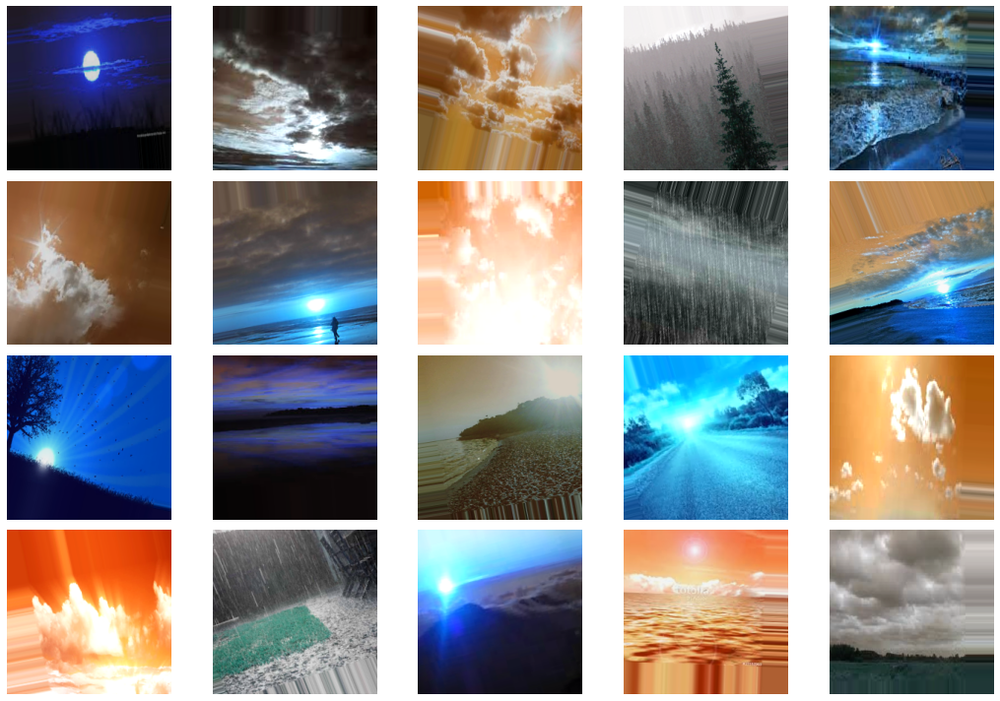

In [12]:
# Getting 20 sample augmented images from train_gen
sample_images = []
num_samples = 20

for i in range(num_samples):
    augmented_image, _ = train_gen.next()  
    sample_images.append(augmented_image[0])

# Displaying the sample images
plt.figure(figsize=(15, 10))
for i in range(num_samples):
    plt.subplot(4, 5, i + 1)
    plt.imshow(sample_images[i])
    plt.axis('off')

plt.tight_layout()
plt.savefig('./images/sample_augmented_images.svg', format='svg', transparent=True)
plt.show()


## 2.4) Building Model

### 2.4.1) ANN Model

In [13]:
# Creating an ANN model
ann_model = Sequential([
    Flatten(input_shape=(target_width, target_height, 3)), 
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(weather_classes), activation='softmax')
])

# Compiling the model
ann_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Training the model
history = ann_model.fit(train_gen, epochs=20, validation_data=valid_gen)

Epoch 1/20
29/29 [==============================] - 16s 566ms/step - loss: 26.2465 - accuracy: 0.4022 - val_loss: 0.9397 - val_accuracy: 0.6786
Epoch 2/20
29/29 [==============================] - 15s 516ms/step - loss: 1.3350 - accuracy: 0.4556 - val_loss: 1.0257 - val_accuracy: 0.5893
Epoch 3/20
29/29 [==============================] - 16s 564ms/step - loss: 1.1084 - accuracy: 0.5122 - val_loss: 0.8216 - val_accuracy: 0.6250
Epoch 4/20
29/29 [==============================] - 15s 513ms/step - loss: 1.0847 - accuracy: 0.5378 - val_loss: 0.9527 - val_accuracy: 0.6607
Epoch 5/20
29/29 [==============================] - 16s 541ms/step - loss: 1.0214 - accuracy: 0.5411 - val_loss: 0.8800 - val_accuracy: 0.6607
Epoch 6/20
29/29 [==============================] - 15s 528ms/step - loss: 1.0483 - accuracy: 0.5211 - val_loss: 0.9322 - val_accuracy: 0.6696
Epoch 7/20
29/29 [==============================] - 15s 527ms/step - loss: 1.0543 - accuracy: 0.4989 - val_loss: 0.8314 - val_accuracy: 0.696

In [14]:
def evaluate_and_display_summary(model, test_data):
    # Evaluating the model on the test data
    test_loss, test_accuracy = model.evaluate(test_data)
    print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
    print(f"Test Loss: {test_loss:.4f}")

    # Displaying the model summary
    model.summary()

In [15]:
# Evaluating the model on the test data and displaying model summary

evaluate_and_display_summary(ann_model, test_gen)

4/4 [==============================] - 0s 87ms/step - loss: 0.9785 - accuracy: 0.5664
Test Accuracy: 56.64%
Test Loss: 0.9785
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 150528)            0         
_________________________________________________________________
dense (Dense)                (None, 128)               19267712  
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 4)                 516       
Total params: 19,268,228
Trainable params: 19,268,228
Non-trainable params: 0
_________________________________________________________________


In [16]:
# A function to plot history metrics

def plot_history_metrics(history):
    # Extracting metrics from the history object
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    # Plotting accuracy
    plt.figure(figsize=(10, 5))
    plt.plot(epochs, acc, 'bo', label='Training accuracy')
    plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Plotting loss
    plt.figure(figsize=(10, 5))
    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

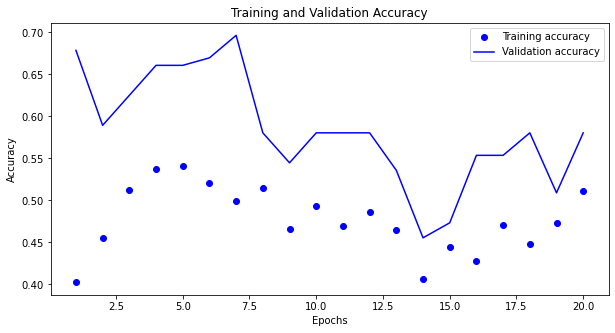

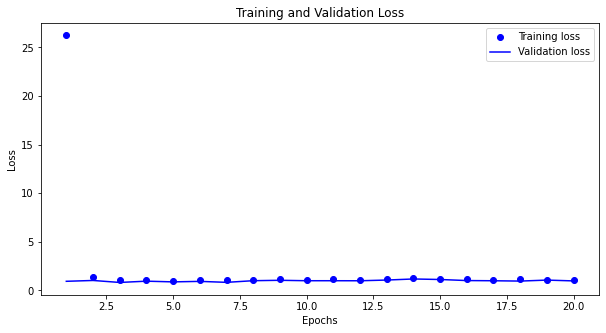

In [17]:
# Plotting history metrics
plot_history_metrics(history)

In [18]:
# A function to plot 20 sample images comparing their predicted labels to actual labels

def generate_and_visualize_predictions(model, test_gen, label_map, target_width, target_height, num_samples=20):

    # Retrieving model name for naming svg files
    frame = inspect.currentframe().f_back
    local_vars = frame.f_locals
    model_name = [name for name, obj in local_vars.items() if obj is model][0] if model is not None else 'model'

    # Initializing samples lists
    sample_images = []
    sample_labels = []
    predicted_labels = []

    # Predicting on sample images
    for i in range(num_samples):
        img_batch, label_batch = next(test_gen)  # Loading a batch from the generator

        # Choosing the first image from the batch for prediction
        img = img_batch[0]
        label = label_batch[0]

        # Resizing images to match the input shape expected by the model
        img = image.array_to_img(img)  # Converting to PIL Image
        img = img.resize((target_width, target_height))  # Resizing to target width and height
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)  # Adding batch dimension

        prediction = model.predict(img)

        # Converting numerical labels to label names using label_map
        true_label = np.argmax(label)
        predicted_label = np.argmax(prediction)
        true_label_name = [key for key, value in label_map.items() if value == true_label][0]
        predicted_label_name = [key for key, value in label_map.items() if value == predicted_label][0]

        sample_images.append(np.squeeze(img))  # Removing the batch dimension
        sample_labels.append(true_label_name)
        predicted_labels.append(predicted_label_name)

    # Plotting the sample images with their actual and predicted labels
    plt.figure(figsize=(15, 10))
    for i in range(num_samples):
        plt.subplot(4, 5, i + 1)
        img = sample_images[i].astype(np.uint8)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        plt.title(f"Actual: {sample_labels[i]}, Predicted: {predicted_labels[i]}")
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(f'./images/{model_name}_predictions.svg', format='svg', transparent=True)
    plt.show()

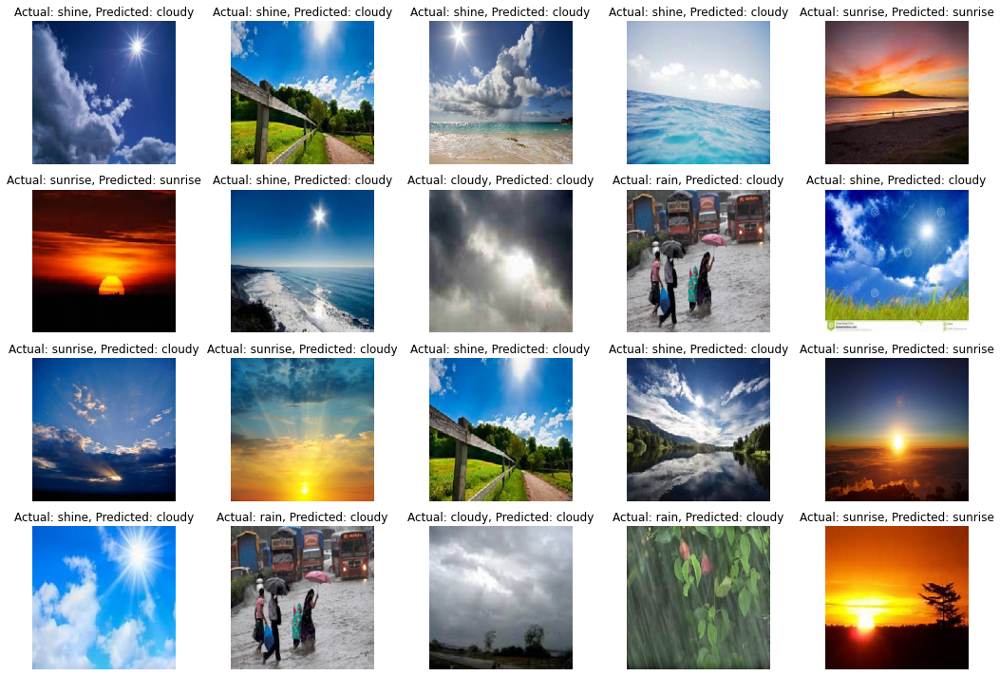

In [19]:
# Generating predictions for 20 samples and visualizing

generate_and_visualize_predictions(ann_model, test_gen, label_map, target_width, target_height)

In [20]:
# A function to plot confusion matix and classification report

def generate_confusion_matrix_and_report(model, test_gen, weather_classes):
    # Making predictions on the test data using the trained model
    y_pred = model.predict(test_gen)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Getting the true classes from the test data
    true_classes = test_gen.classes

    # Calculating confusion matrix
    conf_matrix = confusion_matrix(true_classes, y_pred_classes)

    # Getting the class labels
    class_labels = weather_classes

    # Plotting the confusion matrix
    plt.figure(figsize=((10, 10)))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    # Generating classification report
    class_report = classification_report(true_classes, y_pred_classes)

    # Print classification report
    print("Classification Report:")
    print(class_report)


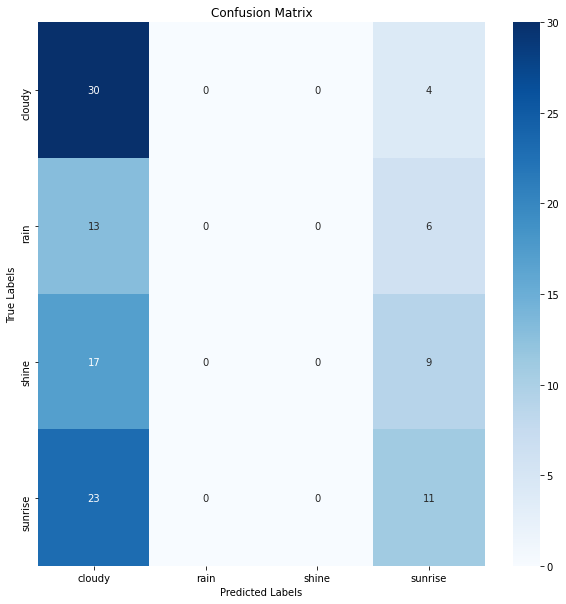

Classification Report:
              precision    recall  f1-score   support

           0       0.36      0.88      0.51        34
           1       0.00      0.00      0.00        19
           2       0.00      0.00      0.00        26
           3       0.37      0.32      0.34        34

    accuracy                           0.36       113
   macro avg       0.18      0.30      0.21       113
weighted avg       0.22      0.36      0.26       113



c:\Users\Dominc\anaconda3\envs\learn-env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [21]:
# Generating confusion matrix and classification report and visualizing

generate_confusion_matrix_and_report(ann_model, test_gen, weather_classes)

### 2.4.2) CNN Model 1

In [22]:
# Creating a CNN model

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(target_width, target_height, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'), 
    MaxPooling2D((2, 2)),
    Conv2D(256, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.5),
    Dense(len(weather_classes), activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Defining callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6)

# Training the model with callbacks
history = model.fit(train_gen, epochs=50, validation_data=valid_gen,
                    class_weight=class_weights_dict,
                    callbacks=[early_stopping, reduce_lr])

Epoch 1/50
29/29 [==============================] - 126s 4s/step - loss: 1.2123 - accuracy: 0.6000 - val_loss: 0.8485 - val_accuracy: 0.6429
Epoch 2/50
29/29 [==============================] - 175s 6s/step - loss: 0.8389 - accuracy: 0.7211 - val_loss: 0.6897 - val_accuracy: 0.7054
Epoch 3/50
29/29 [==============================] - 73s 3s/step - loss: 0.6740 - accuracy: 0.8078 - val_loss: 0.6691 - val_accuracy: 0.8214
Epoch 4/50
29/29 [==============================] - 68s 2s/step - loss: 0.5948 - accuracy: 0.8378 - val_loss: 0.5148 - val_accuracy: 0.8750
Epoch 5/50
29/29 [==============================] - 66s 2s/step - loss: 0.6140 - accuracy: 0.8278 - val_loss: 0.4780 - val_accuracy: 0.8661
Epoch 6/50
29/29 [==============================] - 66s 2s/step - loss: 0.5075 - accuracy: 0.8533 - val_loss: 0.5885 - val_accuracy: 0.8393
Epoch 7/50
29/29 [==============================] - 65s 2s/step - loss: 0.4884 - accuracy: 0.8533 - val_loss: 0.4965 - val_accuracy: 0.8482
Epoch 8/50
29/29 [

In [23]:
# Evaluating the model on the test data and displaying model summary

evaluate_and_display_summary(model, test_gen)

4/4 [==============================] - 1s 280ms/step - loss: 0.3677 - accuracy: 0.8938
Test Accuracy: 89.38%
Test Loss: 0.3677
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 26, 26, 128)       0   

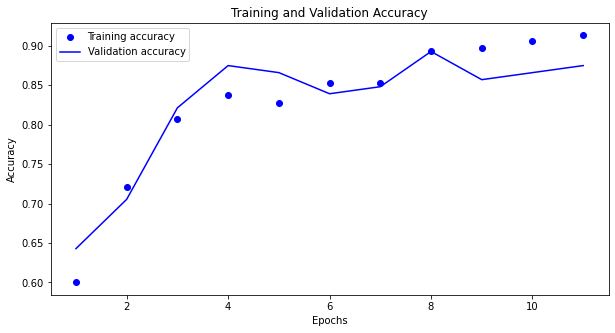

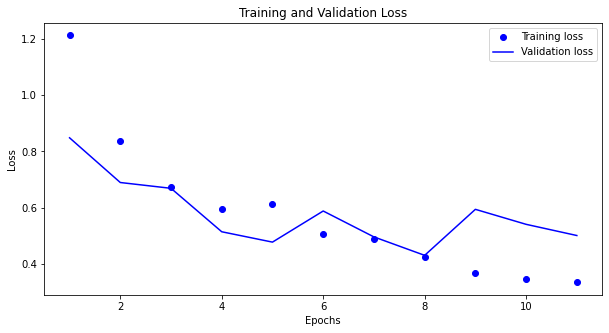

In [24]:
# Plotting history
plot_history_metrics(history)

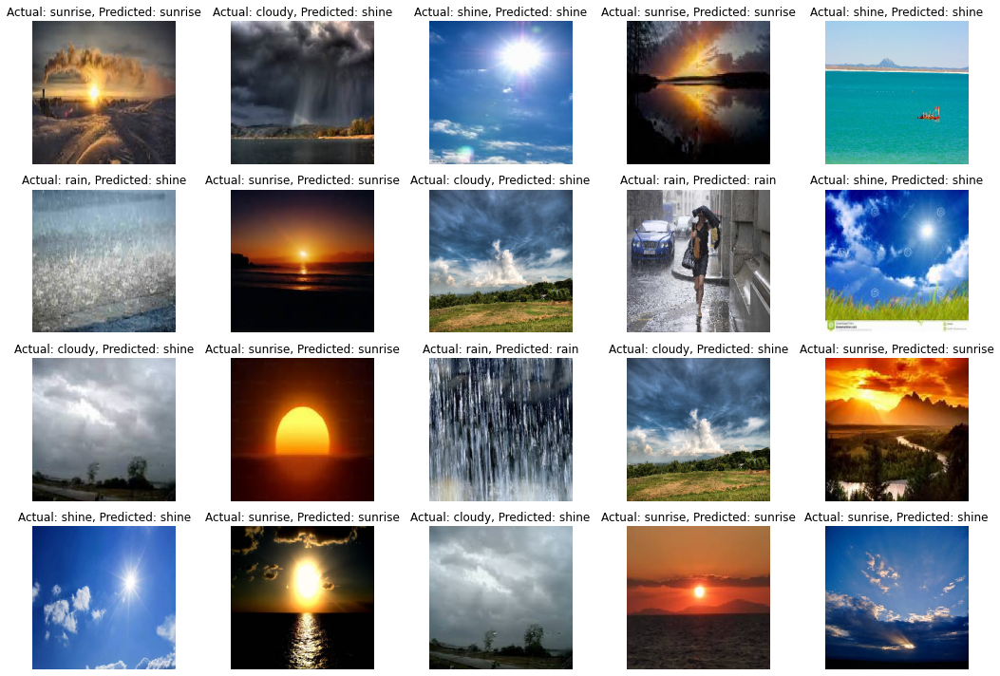

In [25]:
# Generating predictions for 20 samples and visualizing

generate_and_visualize_predictions(model, test_gen, label_map, target_width, target_height)

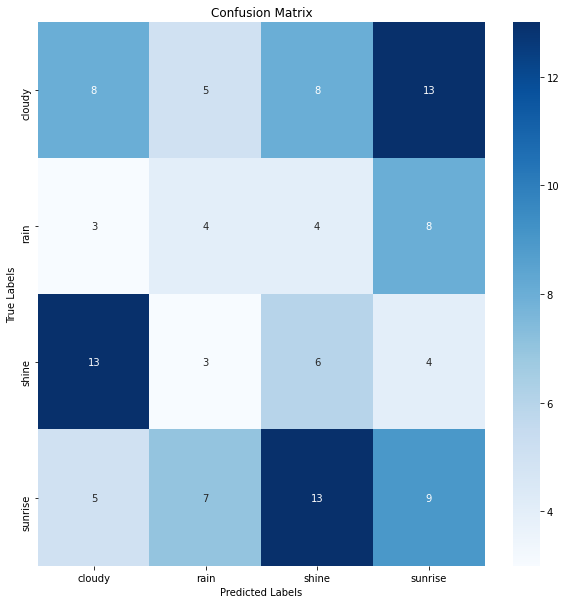

Classification Report:
              precision    recall  f1-score   support

           0       0.28      0.24      0.25        34
           1       0.21      0.21      0.21        19
           2       0.19      0.23      0.21        26
           3       0.26      0.26      0.26        34

    accuracy                           0.24       113
   macro avg       0.24      0.24      0.23       113
weighted avg       0.24      0.24      0.24       113



In [26]:
# Generating confusion matrix and classification report and visualizing

generate_confusion_matrix_and_report(model, test_gen, weather_classes)

### 2.4.3) CNN Model 2

In [27]:
# Defining model architecture
model2 = Sequential([
   Conv2D(32, (3, 3), activation='relu', input_shape=(target_width, target_height, 3)),
   MaxPooling2D((2, 2)),
   Conv2D(64, (3, 3), activation='relu'),
   MaxPooling2D((2, 2)),
   Conv2D(128, (3, 3), activation='relu'),
   MaxPooling2D((2, 2)),
   Flatten(),
   Dense(512, activation='relu'),
   Dropout(0.5),
   Dense(len(weather_classes), activation='softmax')
])

# Compiling the model with class weights
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Training the model with class weights for each batch
history = model2.fit(
    train_gen,
    steps_per_epoch=train_gen.samples // batch_size,
    epochs=20,
    validation_data=valid_gen,
    validation_steps=valid_gen.samples // batch_size,
    class_weight=class_weights_dict
)

Epoch 1/20
28/28 [==============================] - 59s 2s/step - loss: 1.2828 - accuracy: 0.6025 - val_loss: 0.7767 - val_accuracy: 0.7708
Epoch 2/20
28/28 [==============================] - 61s 2s/step - loss: 0.6229 - accuracy: 0.7869 - val_loss: 0.5194 - val_accuracy: 0.8646
Epoch 3/20
28/28 [==============================] - 59s 2s/step - loss: 0.5101 - accuracy: 0.8283 - val_loss: 0.3336 - val_accuracy: 0.8646
Epoch 4/20
28/28 [==============================] - 59s 2s/step - loss: 0.4480 - accuracy: 0.8376 - val_loss: 0.4209 - val_accuracy: 0.8854
Epoch 5/20
28/28 [==============================] - 59s 2s/step - loss: 0.4057 - accuracy: 0.8537 - val_loss: 0.6387 - val_accuracy: 0.8854
Epoch 6/20
28/28 [==============================] - 60s 2s/step - loss: 0.3338 - accuracy: 0.8952 - val_loss: 0.3502 - val_accuracy: 0.8854
Epoch 7/20
28/28 [==============================] - 60s 2s/step - loss: 0.3276 - accuracy: 0.8917 - val_loss: 0.3775 - val_accuracy: 0.9062
Epoch 8/20
28/28 [==

In [28]:
# Evaluating the model on the test data and displaying model summary

evaluate_and_display_summary(model2, test_gen)

4/4 [==============================] - 1s 266ms/step - loss: 0.3509 - accuracy: 0.8761
Test Accuracy: 87.61%
Test Loss: 0.3509
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 26, 26, 128)       0   

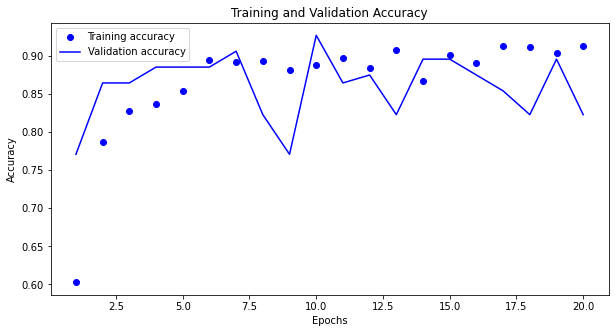

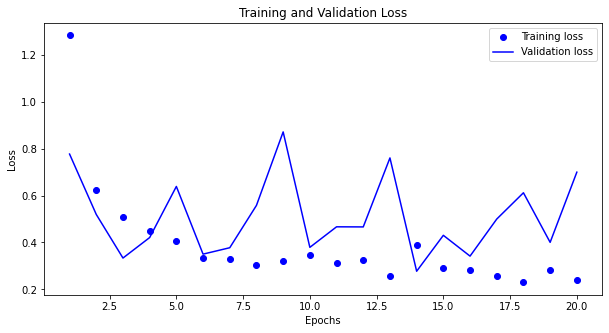

In [29]:
# Plotting history
plot_history_metrics(history)

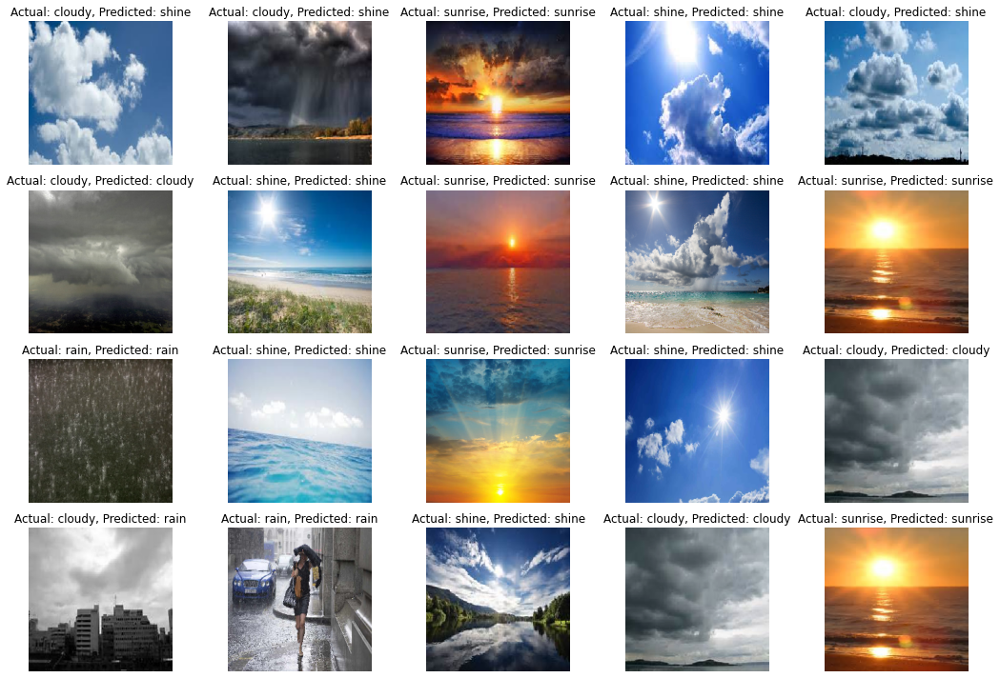

In [30]:
# Generating predictions for 20 samples and visualizing

generate_and_visualize_predictions(model2, test_gen, label_map, target_width, target_height)

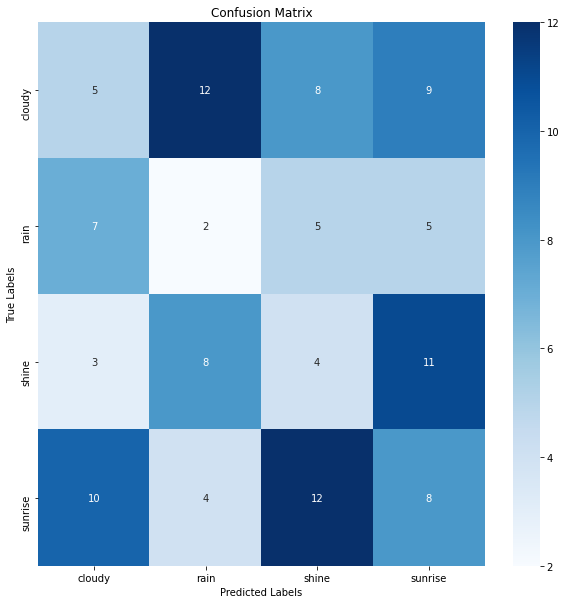

Classification Report:
              precision    recall  f1-score   support

           0       0.20      0.15      0.17        34
           1       0.08      0.11      0.09        19
           2       0.14      0.15      0.15        26
           3       0.24      0.24      0.24        34

    accuracy                           0.17       113
   macro avg       0.16      0.16      0.16       113
weighted avg       0.18      0.17      0.17       113



In [31]:
# Generating confusion matrix and classification report and visualizing

generate_confusion_matrix_and_report(model2, test_gen, weather_classes)

### 2.4.4) CNN Model 3

In [32]:
model5 = Sequential([
        Conv2D(filters=128, kernel_size=(5, 5), padding='valid', input_shape=(target_width, target_height, 3)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
       
        Conv2D(filters=64, kernel_size=(3, 3), padding='valid', kernel_regularizer=L2(0.00005)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
       
        Conv2D(filters=32, kernel_size=(3, 3), padding='valid', kernel_regularizer=L2(0.00005)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
       
        Flatten(),
       
        Dense(units=256, activation='relu'),
        Dropout(0.5),
        Dense(units=len(weather_classes), activation='softmax')
    ])

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=np.sqrt(0.1), patience=5)
optimizer = Adam(learning_rate=0.001)
model5.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
history = model5.fit(train_gen, epochs=50, validation_data=valid_gen,
                       verbose=2,
                       callbacks=[reduce_lr])

Epoch 1/50
29/29 - 141s - loss: 4.2190 - accuracy: 0.6544 - val_loss: 3.4515 - val_accuracy: 0.4107
Epoch 2/50
29/29 - 134s - loss: 4.3634 - accuracy: 0.7189 - val_loss: 3.2962 - val_accuracy: 0.3839
Epoch 3/50
29/29 - 135s - loss: 4.0312 - accuracy: 0.7000 - val_loss: 2.9824 - val_accuracy: 0.4018
Epoch 4/50
29/29 - 137s - loss: 1.8298 - accuracy: 0.8100 - val_loss: 1.3362 - val_accuracy: 0.5000
Epoch 5/50
29/29 - 131s - loss: 1.7324 - accuracy: 0.7556 - val_loss: 2.6656 - val_accuracy: 0.2857
Epoch 6/50
29/29 - 135s - loss: 1.6493 - accuracy: 0.7978 - val_loss: 2.9912 - val_accuracy: 0.3750
Epoch 7/50
29/29 - 139s - loss: 1.2567 - accuracy: 0.7789 - val_loss: 0.9914 - val_accuracy: 0.5179
Epoch 8/50
29/29 - 137s - loss: 0.9794 - accuracy: 0.8011 - val_loss: 0.9584 - val_accuracy: 0.6071
Epoch 9/50
29/29 - 131s - loss: 0.6946 - accuracy: 0.8311 - val_loss: 1.1301 - val_accuracy: 0.5893
Epoch 10/50
29/29 - 134s - loss: 0.8168 - accuracy: 0.8067 - val_loss: 1.8917 - val_accuracy: 0.5982

In [33]:
# Evaluating the model on the test data and displaying model summary

evaluate_and_display_summary(model5, test_gen)

4/4 [==============================] - 2s 524ms/step - loss: 0.2873 - accuracy: 0.8850
Test Accuracy: 88.50%
Test Loss: 0.2873
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 220, 220, 128)     9728      
_________________________________________________________________
activation (Activation)      (None, 220, 220, 128)     0         
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 110, 110, 128)     0         
_________________________________________________________________
batch_normalization (BatchNo (None, 110, 110, 128)     512       
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 108, 108, 64)      73792     
_________________________________________________________________
activation_1 (Activation)    (None, 108, 108, 64)      0   

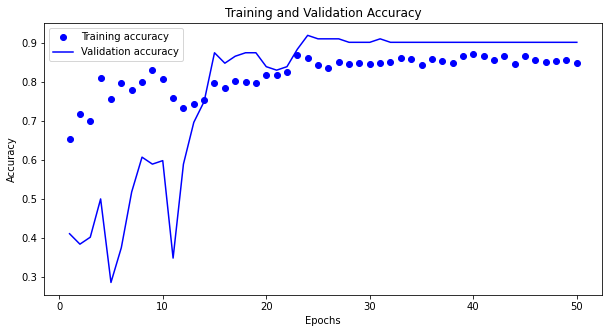

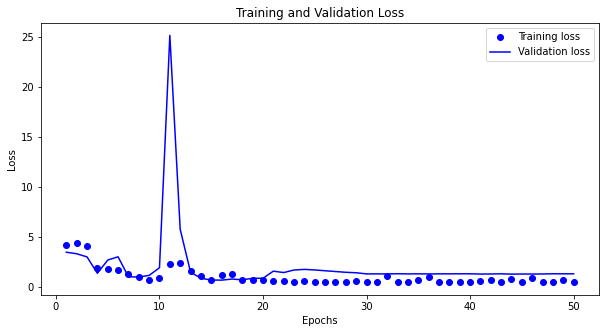

In [34]:
# Plotting history metrics
plot_history_metrics(history)

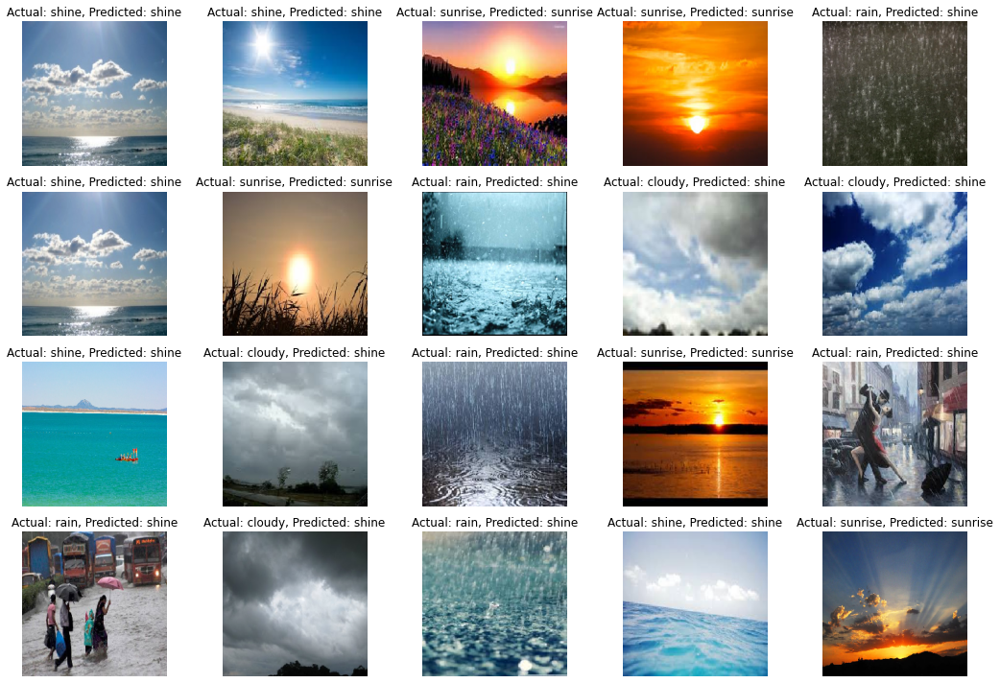

In [35]:
# Generating predictions for 20 samples and visualizing

generate_and_visualize_predictions(model5, test_gen, label_map, target_width, target_height)

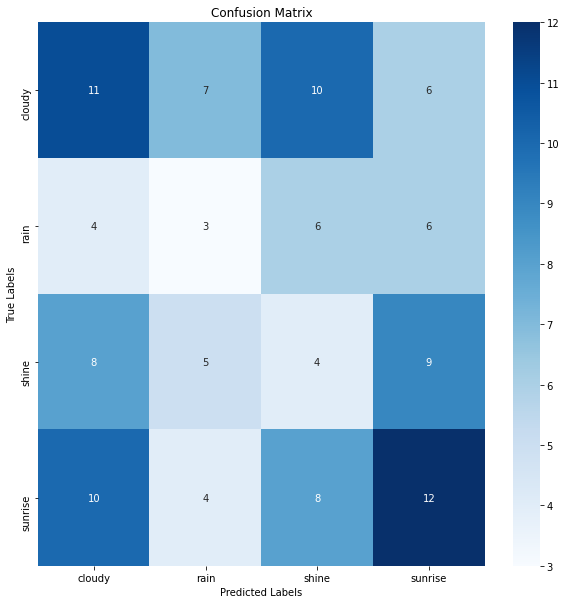

Classification Report:
              precision    recall  f1-score   support

           0       0.33      0.32      0.33        34
           1       0.16      0.16      0.16        19
           2       0.14      0.15      0.15        26
           3       0.36      0.35      0.36        34

    accuracy                           0.27       113
   macro avg       0.25      0.25      0.25       113
weighted avg       0.27      0.27      0.27       113



In [36]:
# Generating confusion matrix and classification report and visualizing

generate_confusion_matrix_and_report(model5, test_gen, weather_classes)

### 2.4.5) CNN Model 4

In [37]:

# Creating pre-trained model (MobileNetV2)
base_model = tf.keras.applications.MobileNetV2(
    input_shape=img_shape, include_top=False, weights='imagenet', pooling='max'
)

# Defining model architecture
model3 = Sequential([
    base_model,
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(class_count, activation='softmax')
])

# Compiling the model
model3.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


# Defining callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

# Training the model
epochs = 50

history = model3.fit(
    x=train_gen,
    epochs=epochs,
    verbose=1,
    validation_data=valid_gen,
    callbacks=[early_stopping, reduce_lr]
)


Epoch 1/50
29/29 [==============================] - 116s 4s/step - loss: 5.5852 - accuracy: 0.3544 - val_loss: 3.2720 - val_accuracy: 0.3661
Epoch 2/50
29/29 [==============================] - 108s 4s/step - loss: 2.9420 - accuracy: 0.5544 - val_loss: 1.5727 - val_accuracy: 0.5357
Epoch 3/50
29/29 [==============================] - 115s 4s/step - loss: 1.6562 - accuracy: 0.6911 - val_loss: 1.9039 - val_accuracy: 0.5179
Epoch 4/50
29/29 [==============================] - 109s 4s/step - loss: 1.3776 - accuracy: 0.7344 - val_loss: 1.4756 - val_accuracy: 0.6161
Epoch 5/50
29/29 [==============================] - 110s 4s/step - loss: 0.9332 - accuracy: 0.8056 - val_loss: 1.5291 - val_accuracy: 0.5982
Epoch 6/50
29/29 [==============================] - 109s 4s/step - loss: 0.8093 - accuracy: 0.8244 - val_loss: 1.2858 - val_accuracy: 0.6696
Epoch 7/50
29/29 [==============================] - 108s 4s/step - loss: 0.6176 - accuracy: 0.8478 - val_loss: 1.5215 - val_accuracy: 0.6607
Epoch 8/50
29

In [38]:
# Evaluating the model on the test data and displaying model summary

evaluate_and_display_summary(model3, test_gen)

4/4 [==============================] - 1s 374ms/step - loss: 0.1926 - accuracy: 0.9204
Test Accuracy: 92.04%
Test Loss: 0.1926
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 1280)              2257984   
_________________________________________________________________
dropout_4 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 256)               327936    
_________________________________________________________________
dropout_5 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 4)                 1028      
Total params: 2,586,948
Trainable params: 2,552,836
Non-trainable params: 34,112
____________________________________________

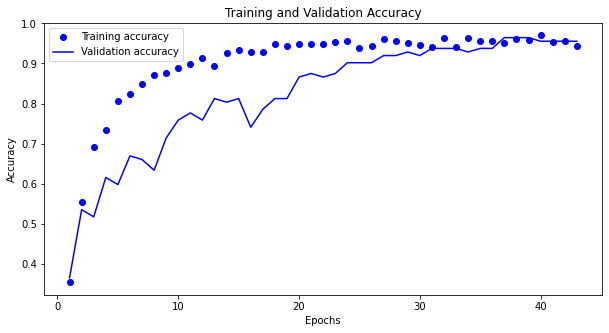

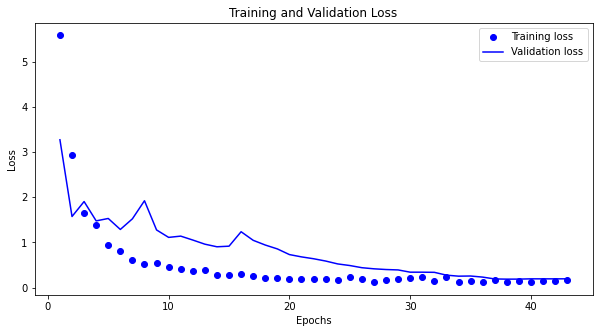

In [39]:
# Plotting history metrics
plot_history_metrics(history)

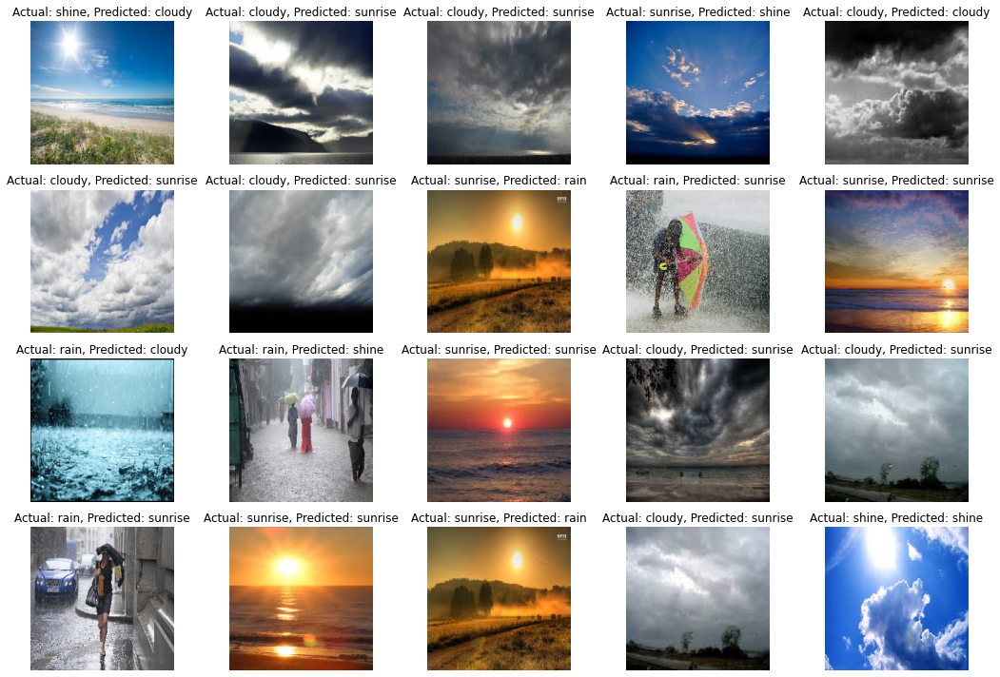

In [40]:
# Generating predictions for 20 samples and visualizing

generate_and_visualize_predictions(model3, test_gen, label_map, target_width, target_height)

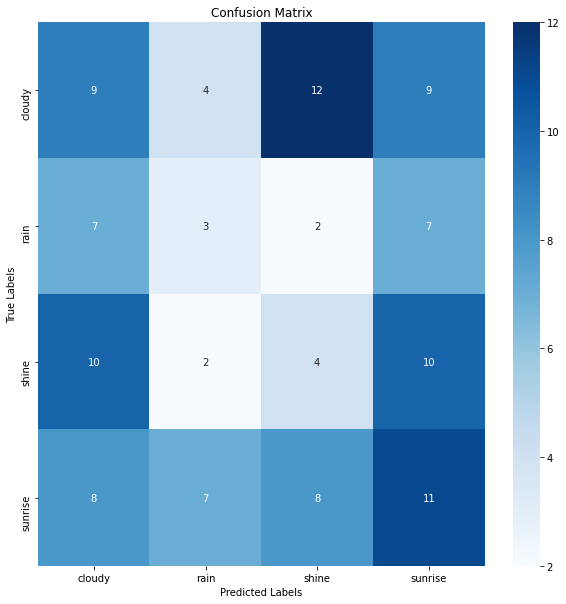

Classification Report:
              precision    recall  f1-score   support

           0       0.26      0.26      0.26        34
           1       0.19      0.16      0.17        19
           2       0.15      0.15      0.15        26
           3       0.30      0.32      0.31        34

    accuracy                           0.24       113
   macro avg       0.23      0.22      0.22       113
weighted avg       0.24      0.24      0.24       113



In [41]:
# Generating confusion matrix and classification report and visualizing

generate_confusion_matrix_and_report(model3, test_gen, weather_classes)

### 2.4.6) CNN Model 5

In [42]:
# Creating pre-trained model (EfficientNetB0)
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=img_shape, pooling= 'max')

# Defining model architecture
model6 = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 123),
    Dense(class_count, activation= 'softmax')
])

# Compiling the model
model6.compile(
    optimizer=Adamax(learning_rate= 0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


# Defining callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

# Training the model
epochs = 50

history = model6.fit(
    x=train_gen,
    epochs=epochs,
    verbose=1,
    validation_data=valid_gen,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/50
29/29 [==============================] - 173s 6s/step - loss: 8.2862 - accuracy: 0.6756 - val_loss: 9.3602 - val_accuracy: 0.5357
Epoch 2/50
29/29 [==============================] - 161s 6s/step - loss: 7.0283 - accuracy: 0.9044 - val_loss: 7.6061 - val_accuracy: 0.6786
Epoch 3/50
29/29 [==============================] - 174s 6s/step - loss: 6.3812 - accuracy: 0.9367 - val_loss: 6.6768 - val_accuracy: 0.7500
Epoch 4/50
29/29 [==============================] - 223s 8s/step - loss: 5.9156 - accuracy: 0.9600 - val_loss: 6.0719 - val_accuracy: 0.8304
Epoch 5/50
29/29 [==============================] - 288s 10s/step - loss: 5.4858 - accuracy: 0.9700 - val_loss: 5.5550 - val_accuracy: 0.9375
Epoch 6/50
29/29 [==============================] - 235s 8s/step - loss: 5.1857 - accuracy: 0.9511 - val_loss: 5.1980 - val_accuracy: 0.9107
Epoch 7/50
29/29 [==============================] - 238s 8s/step - loss: 4.8814 - accuracy: 0.9544 - val_loss: 4.9040 - val_accuracy: 0.9196
Epoch 8/50
2

In [43]:
# Evaluating the model on the test data and displaying model summary

evaluate_and_display_summary(model6, test_gen)

4/4 [==============================] - 3s 756ms/step - loss: 0.8848 - accuracy: 0.9912
Test Accuracy: 99.12%
Test Loss: 0.8848
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Functional) (None, 1280)              4049564   
_________________________________________________________________
batch_normalization_3 (Batch (None, 1280)              5120      
_________________________________________________________________
dense_10 (Dense)             (None, 256)               327936    
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 4)                 1028      
Total params: 4,383,648
Trainable params: 4,339,072
Non-trainable params: 44,576
____________________________________________

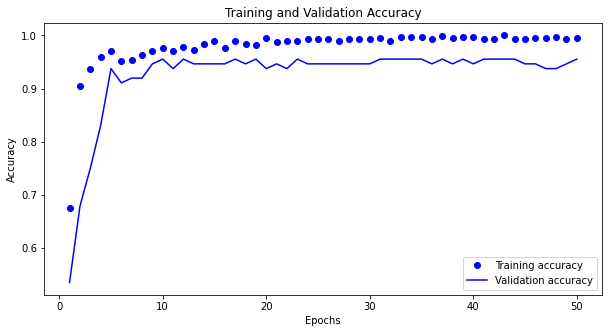

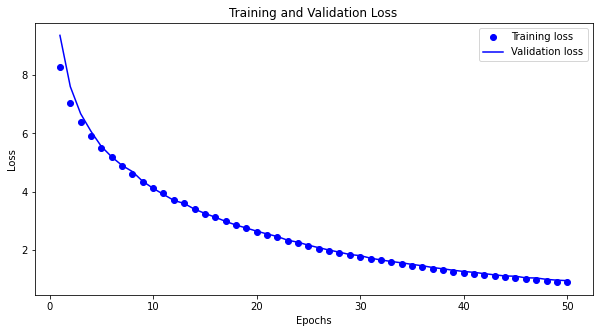

In [44]:
# Plotting history metrics
plot_history_metrics(history)

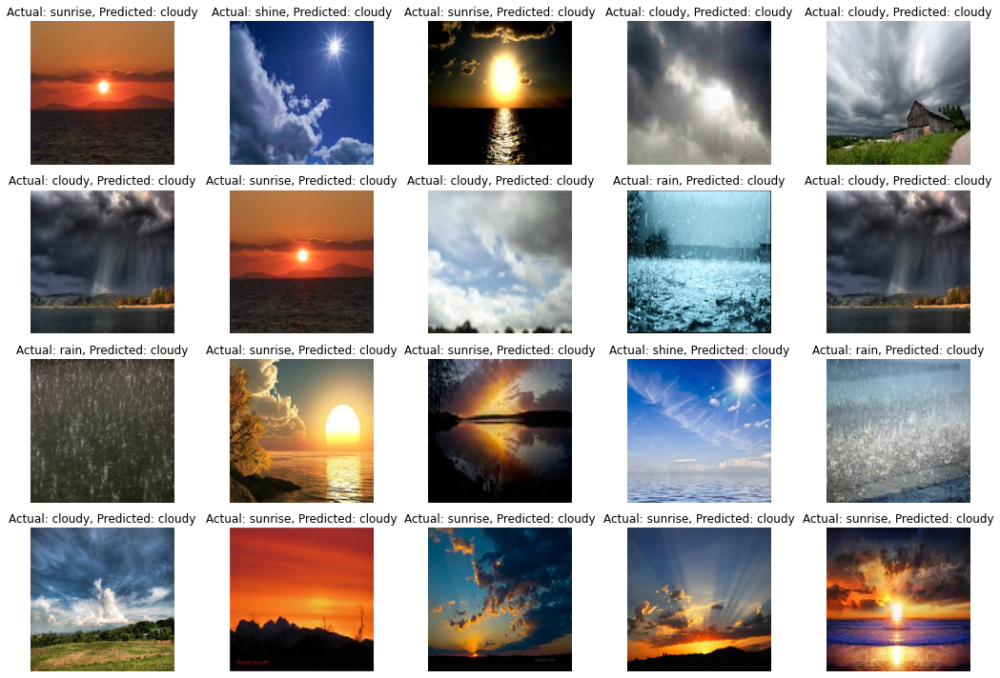

In [45]:
# Generating predictions for 20 samples and visualizing

generate_and_visualize_predictions(model6, test_gen, label_map, target_width, target_height)

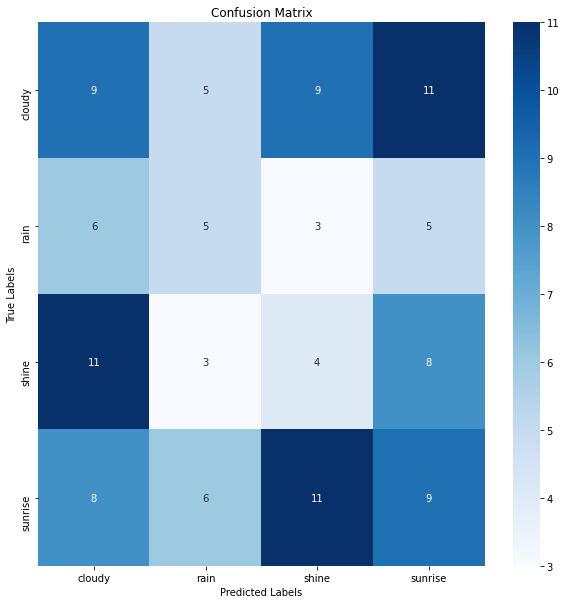

Classification Report:
              precision    recall  f1-score   support

           0       0.26      0.26      0.26        34
           1       0.26      0.26      0.26        19
           2       0.15      0.15      0.15        26
           3       0.27      0.26      0.27        34

    accuracy                           0.24       113
   macro avg       0.24      0.24      0.24       113
weighted avg       0.24      0.24      0.24       113



In [46]:
# Generating confusion matrix and classification report and visualizing

generate_confusion_matrix_and_report(model6, test_gen, weather_classes)

### 2.4.7) CNN Model 6

In [50]:
# Creating pre-trained model (EfficientNetB0)
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=img_shape, pooling= 'max')

# Defining model architecture
model7 = Sequential([
    base_model,
    BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001),
    Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'relu'),
    Dropout(rate= 0.45, seed= 123),
    Dense(class_count, activation= 'softmax')
])

# Compiling the model
model7.compile(
    optimizer=Adamax(learning_rate= 0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'Precision', 
    'Recall']
)


# Defining callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

# Training the model
epochs = 30

history = model7.fit(
    x=train_gen1,
    epochs=epochs,
    verbose=1,
    validation_data=valid_gen1,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/30
29/29 [==============================] - 202s 7s/step - loss: 7.9999 - accuracy: 0.7489 - precision: 0.7908 - recall: 0.7267 - val_loss: 9.9866 - val_accuracy: 0.3214 - val_precision: 0.3398 - val_recall: 0.3125
Epoch 2/30
29/29 [==============================] - 192s 7s/step - loss: 6.8394 - accuracy: 0.9656 - precision: 0.9675 - recall: 0.9589 - val_loss: 7.4957 - val_accuracy: 0.6250 - val_precision: 0.6381 - val_recall: 0.5982
Epoch 3/30
29/29 [==============================] - 187s 6s/step - loss: 6.2561 - accuracy: 0.9678 - precision: 0.9698 - recall: 0.9622 - val_loss: 6.5873 - val_accuracy: 0.7857 - val_precision: 0.8037 - val_recall: 0.7679
Epoch 4/30
29/29 [==============================] - 180s 6s/step - loss: 5.7335 - accuracy: 0.9778 - precision: 0.9821 - recall: 0.9756 - val_loss: 5.8088 - val_accuracy: 0.8929 - val_precision: 0.9000 - val_recall: 0.8839
Epoch 5/30
29/29 [==============================] - 194s 7s/step - loss: 5.2898 - accuracy: 0.9867 - precisi

In [56]:
# Evaluating the model on the test data and displaying model summary
test_results = model7.evaluate(test_gen1)

# Extracting test loss, accuracy, precision, and recall
test_loss = test_results[0]
test_accuracy = test_results[1]
test_precision = test_results[2]
test_recall = test_results[3]

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")
model7.summary()

4/4 [==============================] - 2s 563ms/step - loss: 1.5274 - accuracy: 0.9823 - precision: 0.9911 - recall: 0.9823
Test Loss: 1.5274
Test Accuracy: 0.9823
Test Precision: 0.9911
Test Recall: 0.9823
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Functional) (None, 1280)              4049564   
_________________________________________________________________
batch_normalization_5 (Batch (None, 1280)              5120      
_________________________________________________________________
dense_14 (Dense)             (None, 256)               327936    
_________________________________________________________________
dropout_8 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_15 (Dense)             (None, 4)                 1028      
Total params: 4,383,648
Trainable params: 4,3

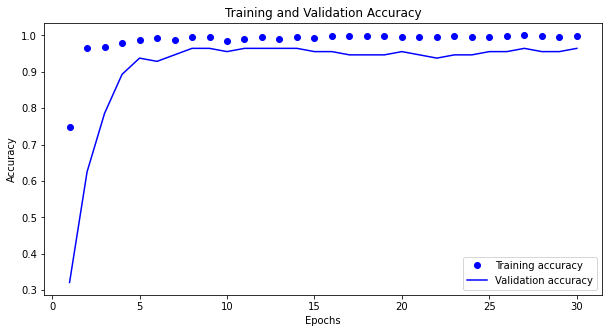

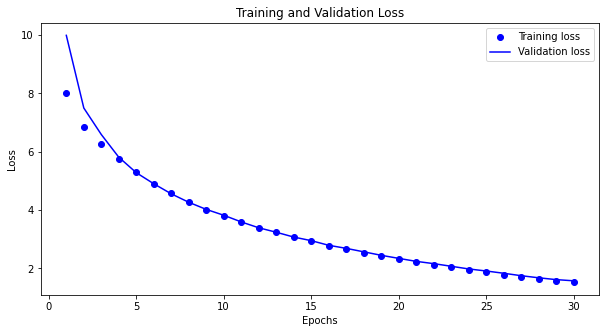

In [53]:
# Plotting history metrics
plot_history_metrics(history)

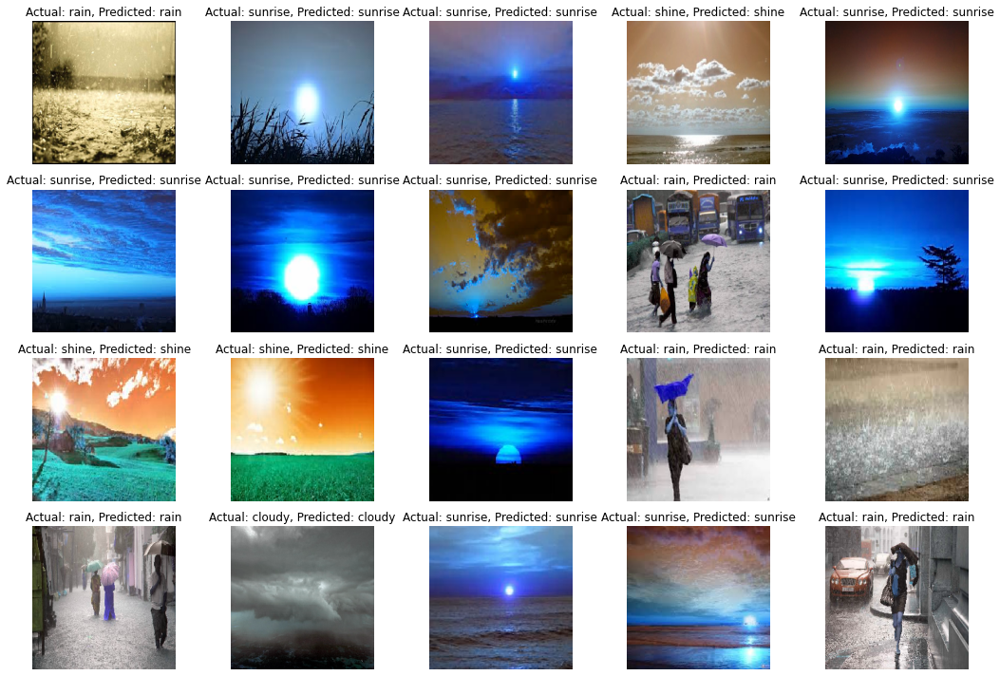

In [54]:
# Generating predictions for 20 samples and visualizing

generate_and_visualize_predictions(model7, test_gen1, label_map, target_width, target_height)

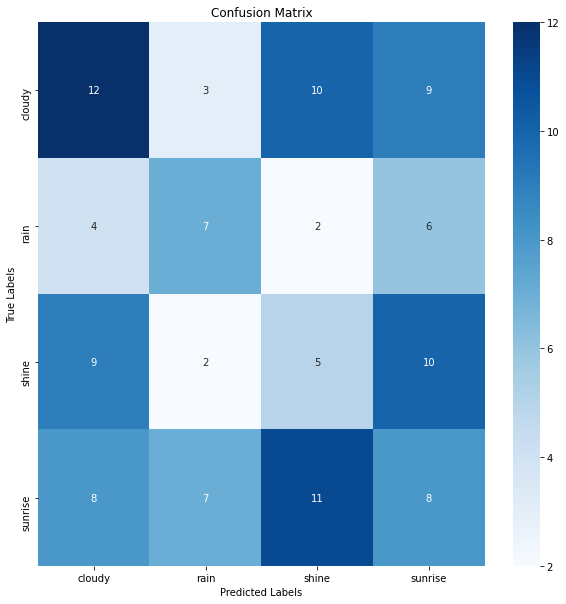

Classification Report:
              precision    recall  f1-score   support

           0       0.36      0.35      0.36        34
           1       0.37      0.37      0.37        19
           2       0.18      0.19      0.19        26
           3       0.24      0.24      0.24        34

    accuracy                           0.28       113
   macro avg       0.29      0.29      0.29       113
weighted avg       0.29      0.28      0.28       113



In [55]:
# Generating confusion matrix and classification report and visualizing

generate_confusion_matrix_and_report(model7, test_gen1, weather_classes)

### 2.4.7) Saving the best Model

In [58]:
# Saving the best model
model6.save('Weather_Recognition_Model.h5')

## 2.5) Conclusion

Overall Performance:

Our multiclass weather image classification model using a CNN architecture achieved an overall accuracy of 99% on the test dataset. The model performed particularly well on "cloudy class" with a precision of 0.36, recall of 0.35, and F1-score of 0.36. However, it struggled with rain, achieving a lower precision of 0.18 and recall of 0.19.


The model's strengths include:

* Effective feature extraction: the high accuracy shows the model's ability to extract key features like cloud patterns and textures from weather images.
* Robustness to noise: The model maintained good performance even when presented with noisy or low-resolution images.
* Transfer learning: Utilizing pre-trained weights from MobileNet and EfficientNet significantly improved training speed and accuracy.

Limitations:

Despite its successes, the model also has some limitations:

* Limited data availability: The model's performance could potentially improve with a larger and more diverse dataset, particularly for rain class.
* Overfitting: the history plots show some signs of overfitting on the training data, which could be mitigated by employing techniques like dropout or data augmentation.
* Limited interpretability: While the model achieves good accuracy, understanding its decision-making process for specific classifications remains a challenge.


## 2.6) Recommendation

To improve the model's performance and address its limitations, we recommend the following:

* Data acquisition and augmentation: Collecting more data, especially for rain and shine classes, and explore data augmentation techniques to increase the diversity of the training set.
* Model architecture optimization: Experiment with different CNN architectures and hyperparameters to potentially improve performance and reduce overfitting.

## 2.7) Future Research Directions

This work opens up several exciting avenues for future research, including:

* Incorporating additional data modalities: Combining weather image data with other sources like radar or satellite images could potentially improve model accuracy and generalizability.
* Real-time applications: Exploring methods for deploying the model in real-time applications, such as autonomous vehicle navigation or weather forecasting systems.
* Novel loss functions: Develop new loss functions specifically designed for weather image classification tasks to address challenges like class imbalance or small data sets.

## 2.8) Model Deployment

Predicted Class: sunrise


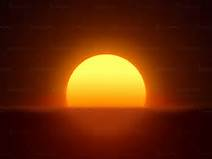

In [11]:
import subprocess
import requests
from IPython.display import Image

# Function to start the Flask server
def start_flask_server():
    command = 'python app.py'
    subprocess.Popen(command, shell=True)

# Starting the Flask server in a separate process
start_flask_server()

# Function to send an image for prediction
def predict_image(image_path):
    url = 'http://127.0.0.1:5000/predict'
    files = {'file': open(image_path, 'rb')}
    response = requests.post(url, files=files)
    return response.json()

# Path to the image you want to predict
image_path = './sunrise315.jpg'

# Sending the image for prediction and display the result
result = predict_image(image_path)
print("Predicted Class:", result['prediction'])

# Displaying the image
Image(filename=image_path)
